In [1]:
%load_ext autoreload 
%autoreload 2   

%matplotlib inline 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Needed for 3D projection

import matplotlib
from seismic_utils import *

In [2]:
# Python: 3.10.13 
# numpy: 2.2.6
# pandas: 2.3.1
# matplotlib: 3.10.5

data source
https://zenodo.org/records/3755060

"""
This project uses the benchmark dataset provided by Alaudah et al. (2019):
"A machine-learning benchmark for facies classification", Interpretation, 7(3), SE175–SE187.
DOI: 10.1190/INT-2018-0249.1
"""

# Load Data

In [3]:
train_seismic = np.load('data/TrainData/train_seismic.npy')
train_label = np.load('data/TrainData/train_labels.npy')

print(train_seismic.shape)
print(train_label.shape)

(401, 701, 255)
(401, 701, 255)


In [4]:

test_seismic = np.load('data/OpenTest/opentest_seismic.npy')
test_label = np.load('data/Validation/opentest_labels.npy')
print(test_seismic.shape)
print(test_label.shape)

(200, 701, 255)
(200, 701, 255)


In [5]:
train_seismic[int(100),:,:]

array([[ 0.        , -0.02550608, -0.13870096, ...,  0.041988  ,
         0.05579965,  0.05579965],
       [ 0.        , -0.02908307, -0.15509244, ..., -0.04903346,
        -0.0285654 , -0.0285654 ],
       [ 0.        , -0.0258237 , -0.13912314, ..., -0.04853892,
        -0.02825215, -0.02825215],
       ...,
       [ 0.        ,  0.01736472,  0.06006299, ..., -0.07420862,
        -0.06804707, -0.06804707],
       [ 0.        ,  0.02227517,  0.08237604, ..., -0.07297459,
        -0.06473747, -0.06473747],
       [ 0.        ,  0.02341778,  0.08896164, ..., -0.10631629,
        -0.10157145, -0.10157145]], shape=(701, 255))

In [6]:
np.unique(train_label)

array([0, 1, 2, 3, 4, 5], dtype=uint8)

In [7]:
unique_labels, counts = np.unique(train_label, return_counts=True)

In [8]:
label_colours= np.asarray([ [69,117,180], [145,191,219], [224,243,248], [254,224,144], [252,141,89],
                        [215,48,39]])
label_colours

array([[ 69, 117, 180],
       [145, 191, 219],
       [224, 243, 248],
       [254, 224, 144],
       [252, 141,  89],
       [215,  48,  39]])

In [9]:
train_seismic.shape

(401, 701, 255)

In [10]:
train_label.shape

(401, 701, 255)

# Plot 2D

## Tutorial

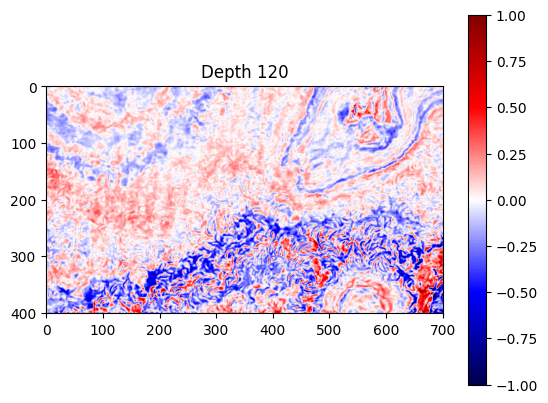

In [11]:
show_depth_slice(train_seismic, 120)


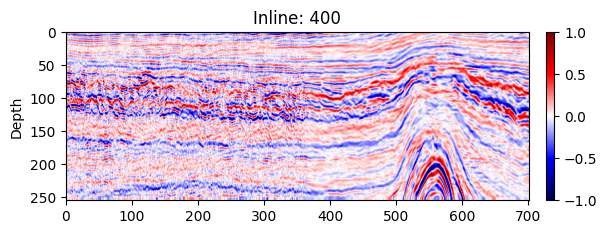

In [12]:
show_inline(train_seismic, 400)


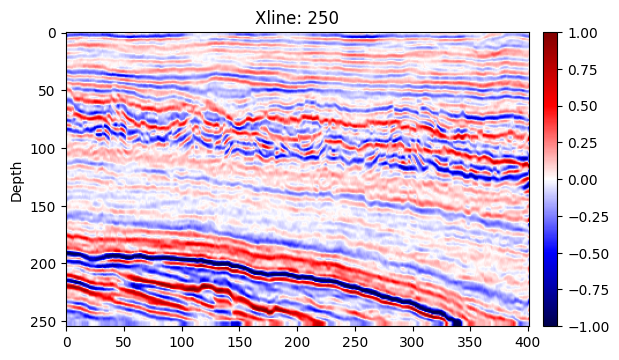

In [13]:
show_xline(train_seismic, 250)

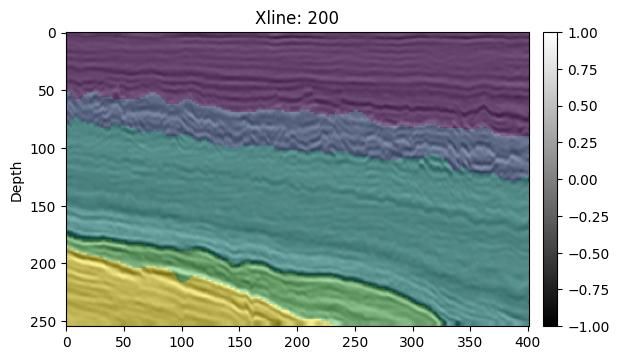

In [14]:
# show_xline(train_seismic, 400)
show_xline(train_seismic, 200, label=train_label, cmap='gray')

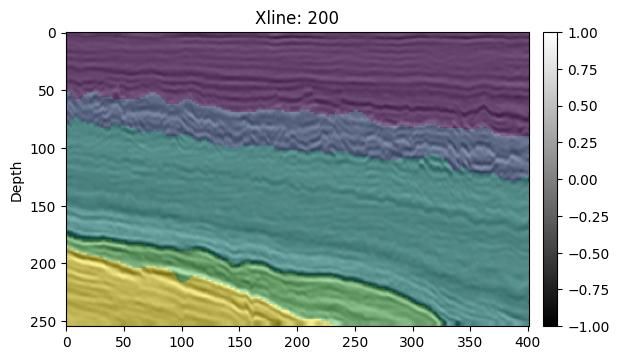

In [15]:
show_xline(train_seismic, 200, label=train_label, cmap='gray')

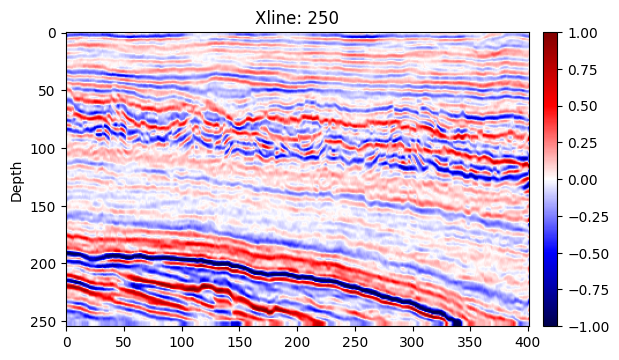

In [16]:
show_xline(train_seismic, 250)

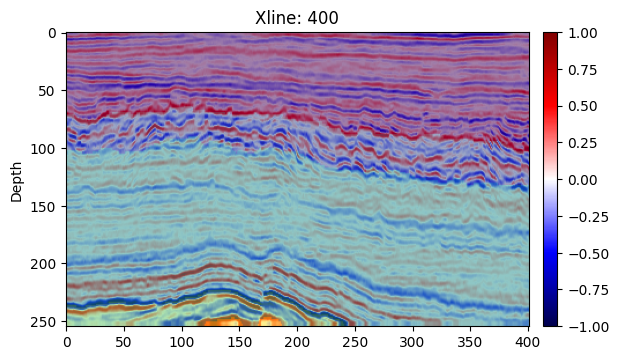

In [17]:
show_xline(train_seismic, 400, label=train_label, display_mode='overlay')

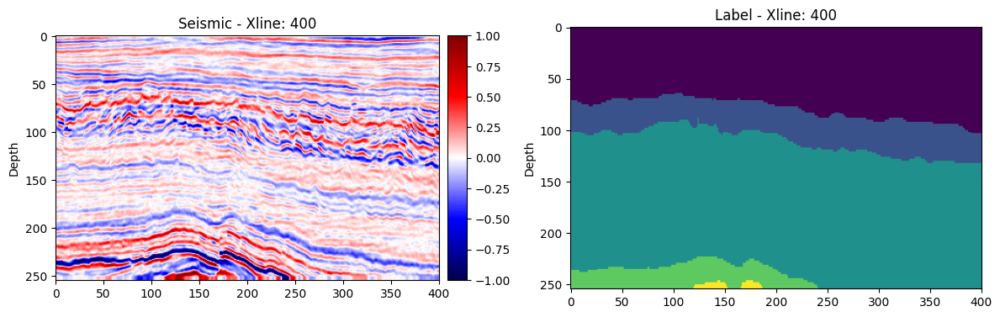

In [18]:
show_xline(train_seismic, 400, label=train_label, display_mode='side_by_side')  # side-by-side display

In [19]:
label_dict={'class':{0: 'Class A',
 1: 'Class B',
 2: 'Class C',
 3: 'Class D',
 4: 'Class E',
 5: 'Class F',},

 'color': {
        0: 'dodgerblue',  
        1: 'darkorange',  
        2: 'skyblue',    
        3: 'forestgreen', 
        4: 'gray',        
        5: 'hotpink',     
    },
 
 }

In [20]:
# pd.DataFrame(label_dict).to_json("Seismic Challenge/data/facies_dictionary.json")

['dodgerblue', 'darkorange', 'skyblue', 'forestgreen', 'gray', 'hotpink']


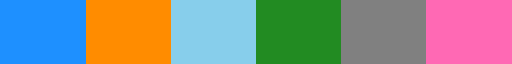

In [21]:
get_label_color(train_label, label_dict)

## Train

['skyblue', 'forestgreen', 'gray', 'hotpink']


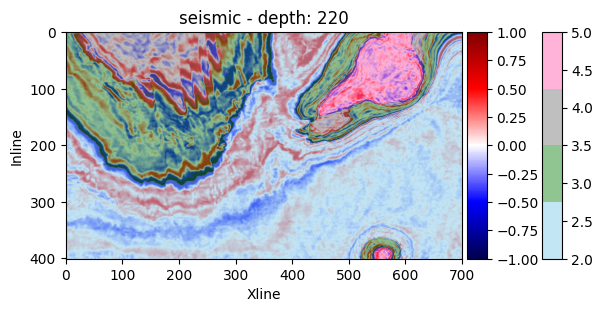

In [22]:

# plot_seismic(train_seismic, 400, label=train_label, display_mode='overlay')  # overlay display
plot_seismic(train_seismic, 220, line_type='depth', label=train_label, label_dict=label_dict,)
# plot_seismic(train_seismic, 200, line_type='inline', label=train_label, label_dict=label_dict, display_mode='side_by_side')  # side-by-side display


['skyblue', 'forestgreen', 'gray', 'hotpink']


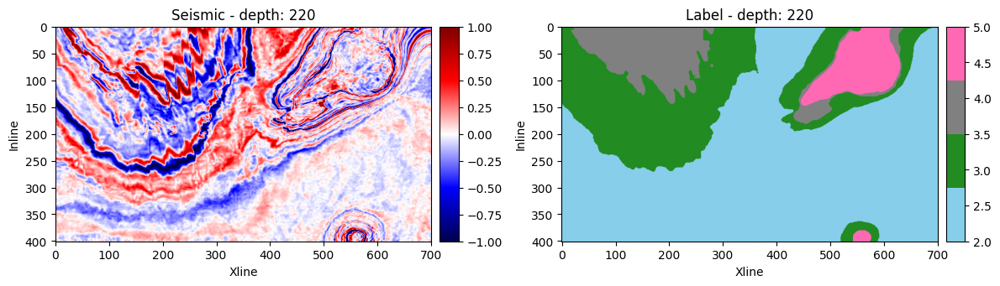

In [23]:
plot_seismic(train_seismic, 220, line_type='depth', label=train_label, label_dict=label_dict, display_mode='side_by_side')

['dodgerblue', 'darkorange', 'skyblue', 'forestgreen', 'gray']


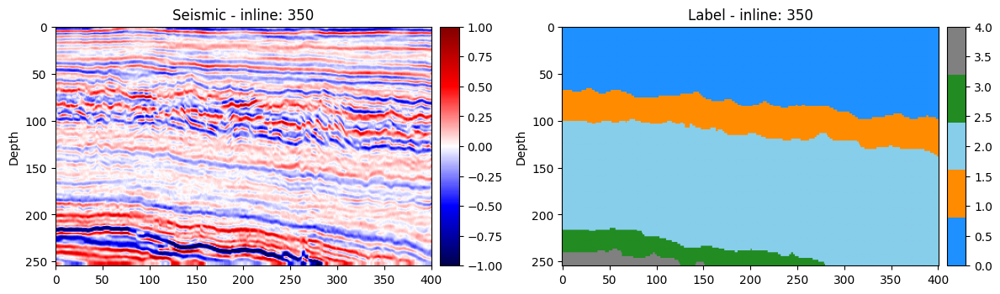

In [24]:
plot_seismic(train_seismic, 350, line_type='inline', label=train_label, label_dict=label_dict, display_mode='side_by_side')  # side-by-side display

['dodgerblue', 'darkorange', 'skyblue']


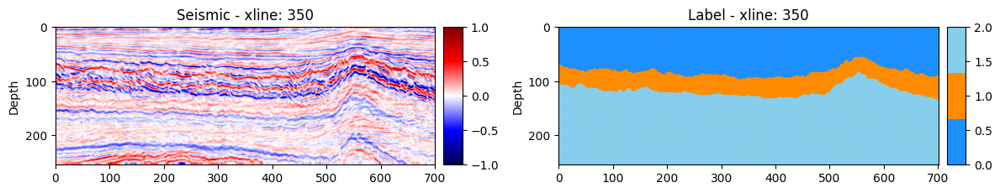

In [25]:
plot_seismic(train_seismic, 350, line_type='xline', label=train_label, label_dict=label_dict, display_mode='side_by_side')  # side-by-side display

['skyblue', 'forestgreen', 'gray', 'hotpink']


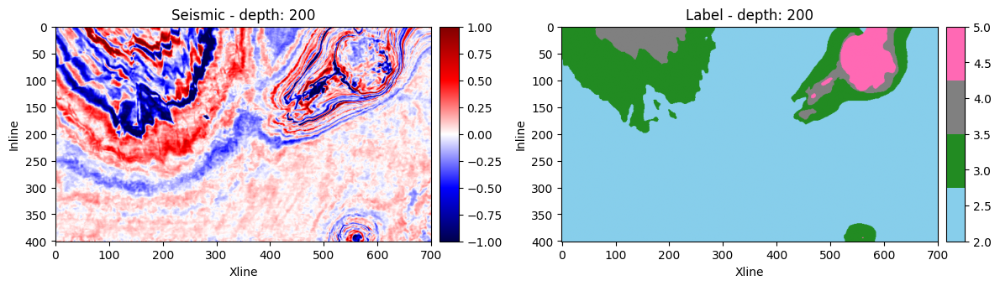

In [26]:
plot_seismic(train_seismic, 200, line_type='depth', label=train_label, label_dict=label_dict, display_mode='side_by_side')  # side-by-side display

['skyblue', 'forestgreen', 'gray', 'hotpink']


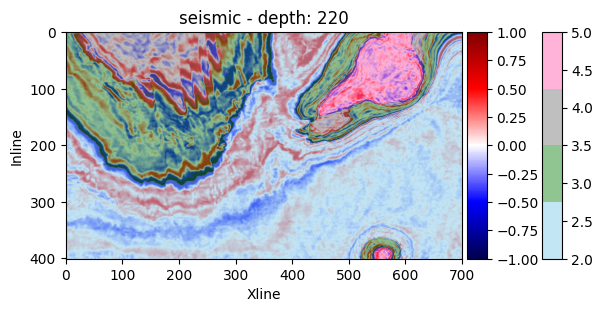

In [27]:
plot_seismic(train_seismic, 220, line_type='depth', label=train_label, label_dict=label_dict,)

['dodgerblue', 'darkorange', 'skyblue', 'forestgreen', 'gray', 'hotpink']


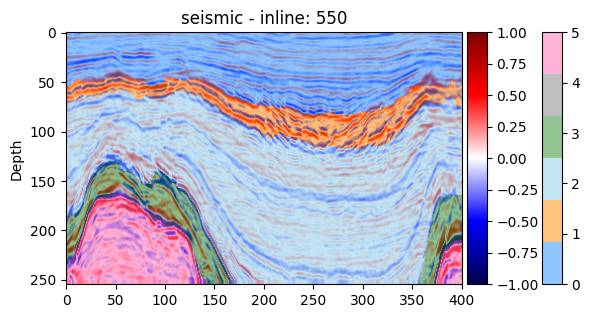

In [28]:
plot_seismic(train_seismic, 550, line_type='inline', label=train_label, label_dict=label_dict,)

# Test

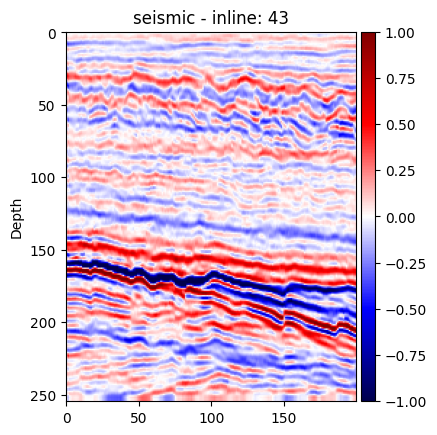

In [29]:
plot_seismic(test_seismic, 43, line_type='inline', label=None, label_dict=label_dict)  # side-by-side display


['dodgerblue', 'darkorange', 'skyblue', 'forestgreen', 'gray']


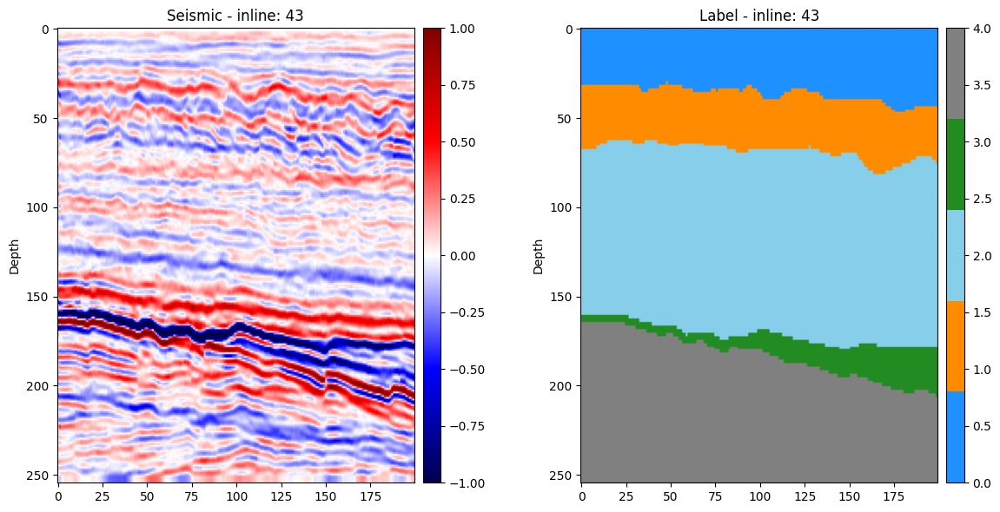

In [30]:
plot_seismic(test_seismic, 43, line_type='inline', label=test_label, label_dict=label_dict, display_mode='side_by_side')  # side-by-side display

['dodgerblue', 'darkorange', 'skyblue', 'forestgreen', 'gray', 'hotpink']


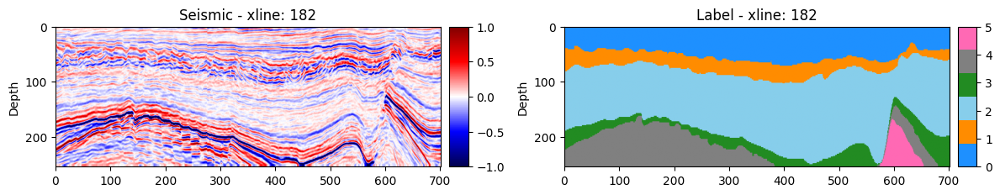

In [ ]:
plot_seismic(test_seismic, 182, line_type='xline', label=test_label, label_dict=label_dict, display_mode='side_by_side')  # side-by-side display

In [32]:
(0, test_seismic.shape[0] - 1)

(0, 199)

In [33]:
test_seismic.shape

(200, 701, 255)

Displaying random xline slice: 29


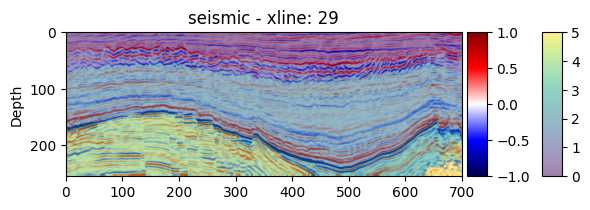

In [34]:
show_random_line(test_seismic, line_type='xline', label=test_label, cmap='seismic', display_mode='overlay')

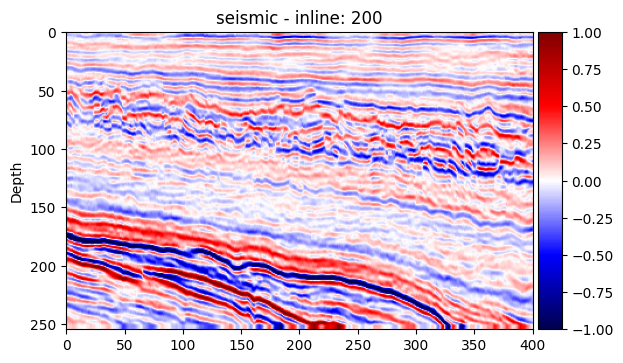

In [35]:
plot_seismic(train_seismic, 200, line_type='inline')

# 3D

In [36]:
train_seismic.shape

(401, 701, 255)

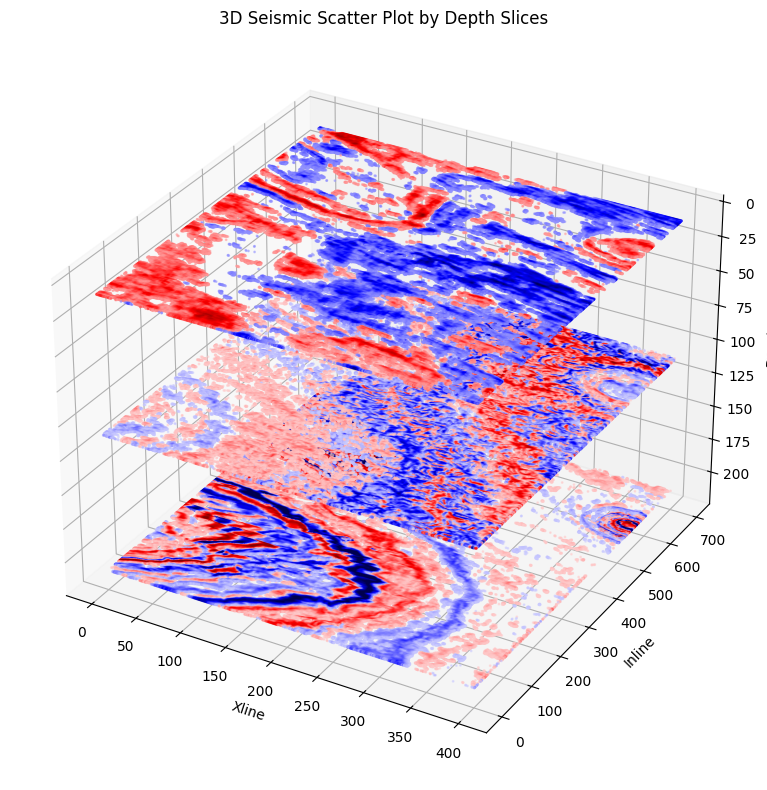

In [ ]:
plot_seismic_3d_slices(train_seismic, 
                       direction='depth', 
                       step=100, 
                       threshold=0.1, 
                       start=10,
                    #    cmap='grey'
                       cmap='seismic'

                       )

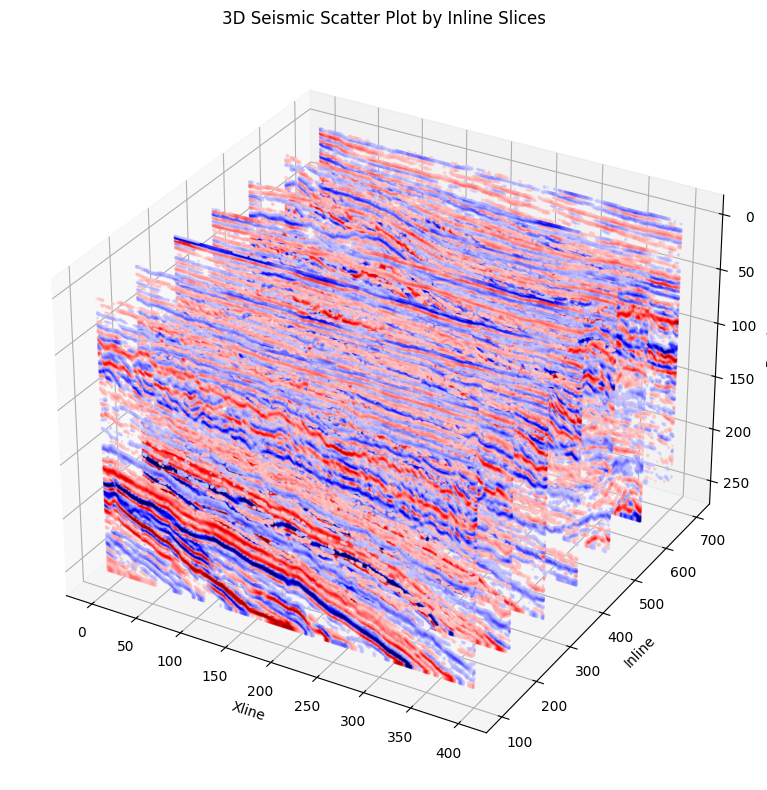

In [ ]:
plot_seismic_3d_slices(train_seismic, 
                       direction='inline', 
                       step=100, 
                       threshold=0.1, 
                       start=100,
                       cmap='seismic')

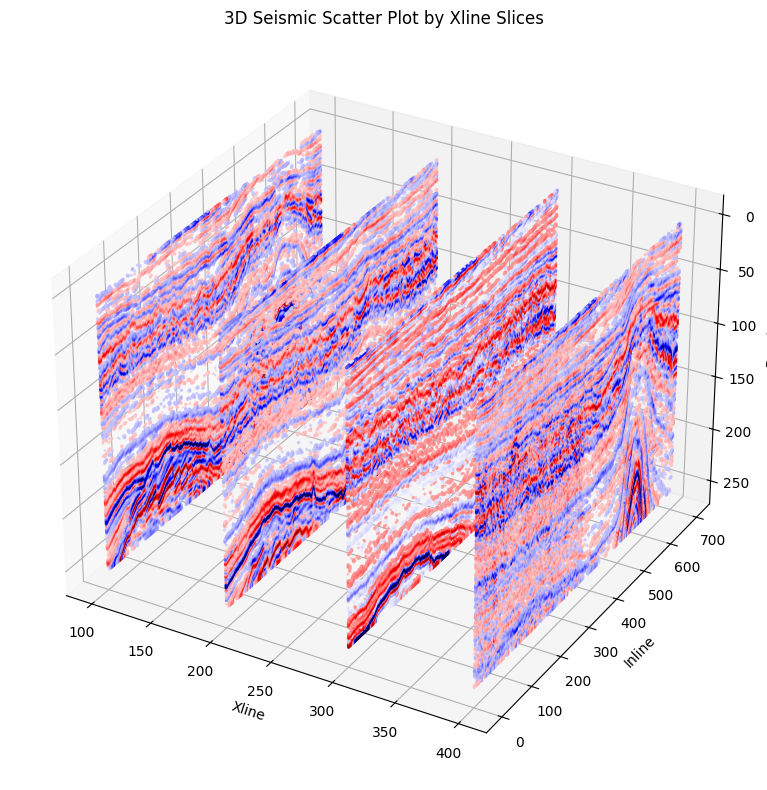

In [ ]:
plot_seismic_3d_slices(train_seismic, 
                       direction='xline', 
                       step=100, 
                       threshold=0.1, 
                       start=100,
                       cmap='seismic')

## Orthogonal Views

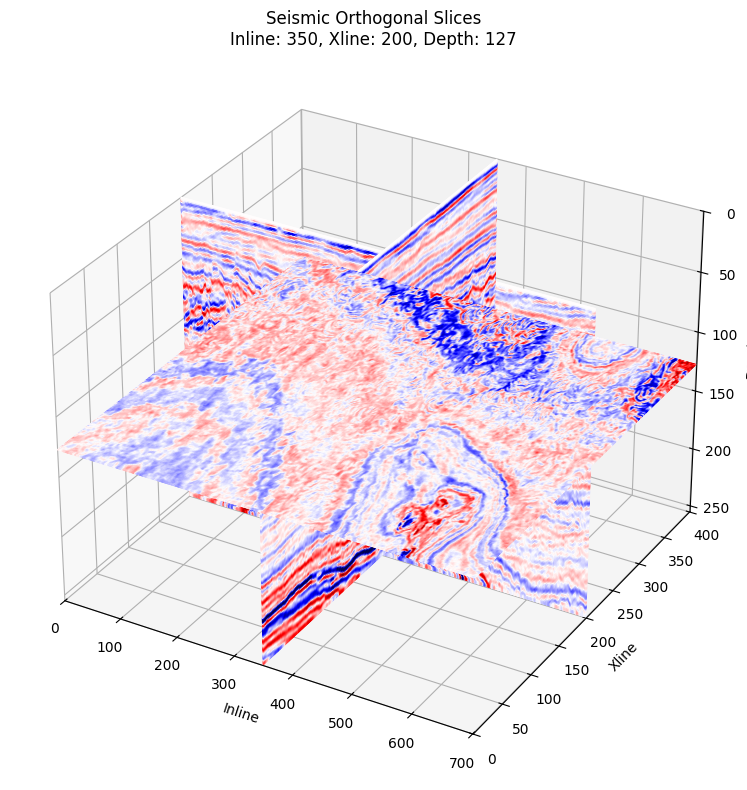

In [46]:
plot_seismic_cube_slice(train_seismic)

In [126]:
train_seismic.shape

(401, 701, 255)

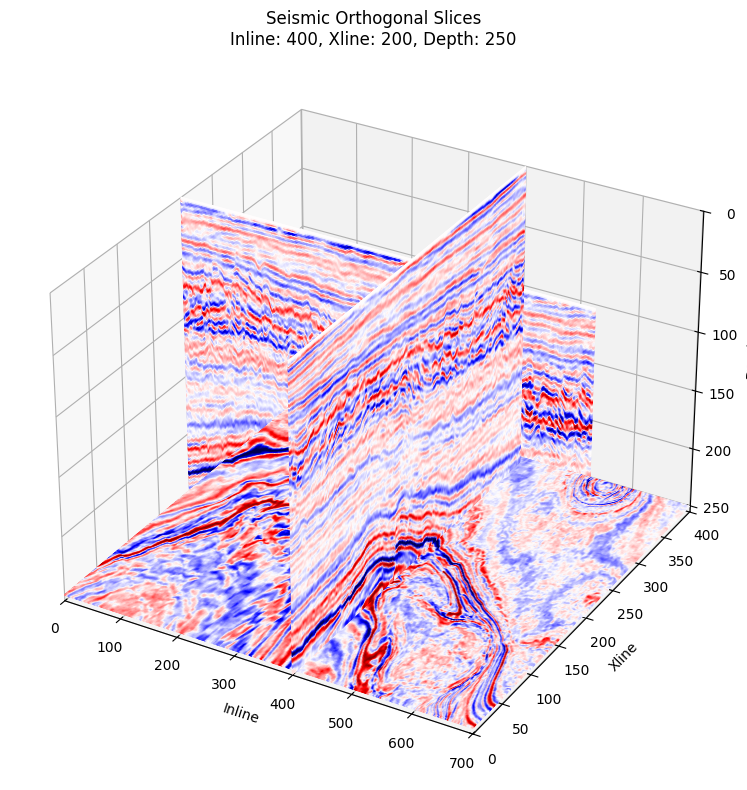

In [56]:
plot_seismic_cube_slice(train_seismic, inline_idx=400, xline_idx=200, depth_idx=250, cmap='seismic', alpha=0.5)


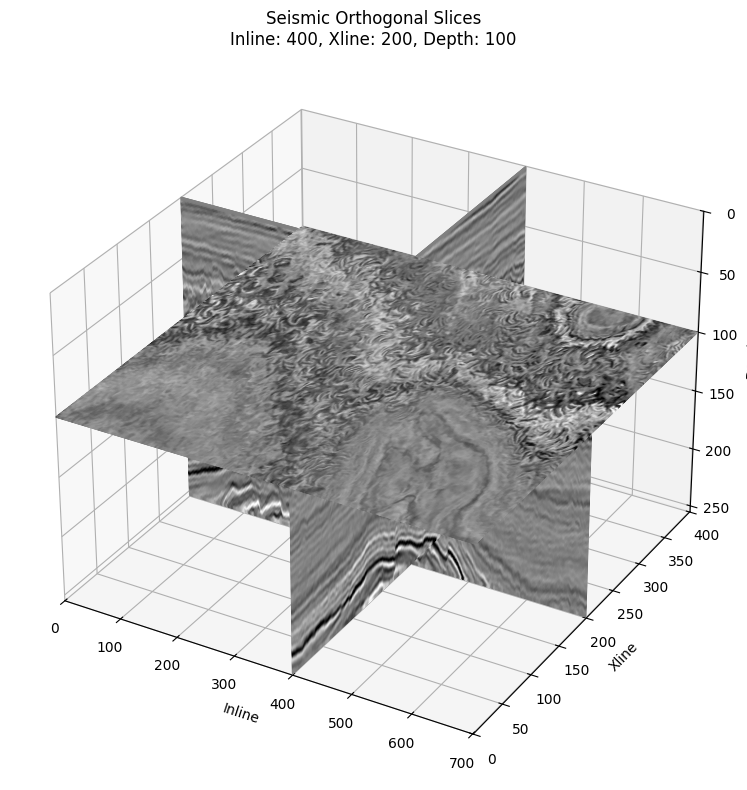

In [47]:
plot_seismic_cube_slice(train_seismic, inline_idx=400, xline_idx=200, depth_idx=100, cmap='grey', alpha=0.5)

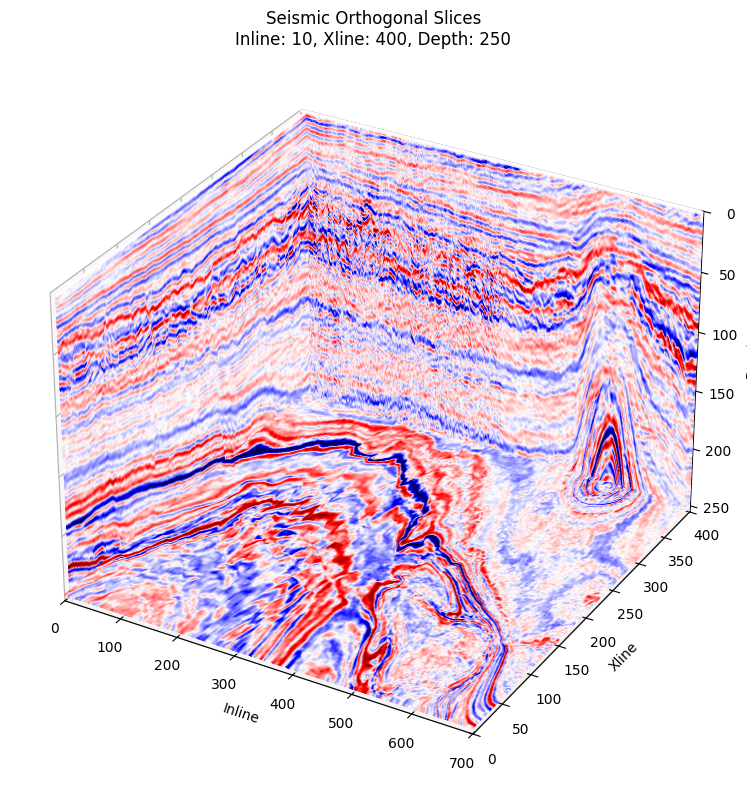

In [54]:
plot_seismic_cube_slice(train_seismic, inline_idx=10, xline_idx=400, depth_idx=250, cmap='seismic', alpha=0.5)

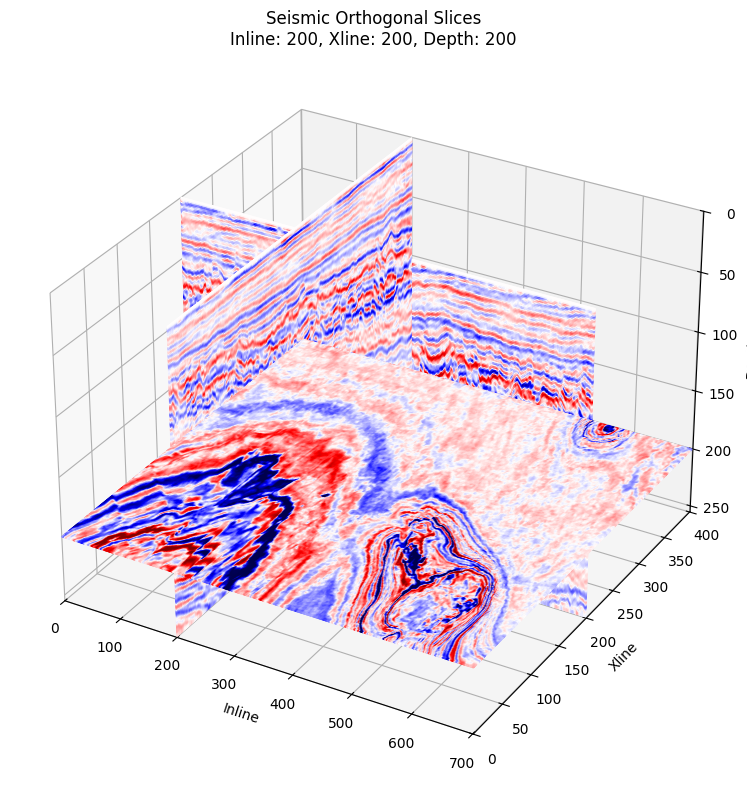

In [49]:
plot_seismic_cube_slice(train_seismic, inline_idx=200, xline_idx=200, depth_idx=200, cmap='seismic', alpha=0.5)

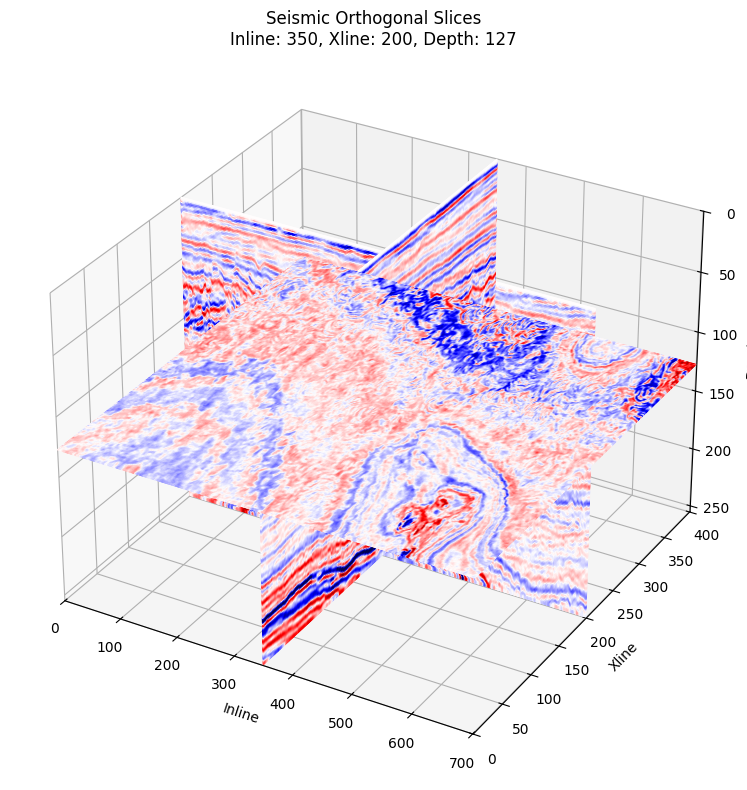

In [64]:
plot_seismic_cube_slice(train_seismic)


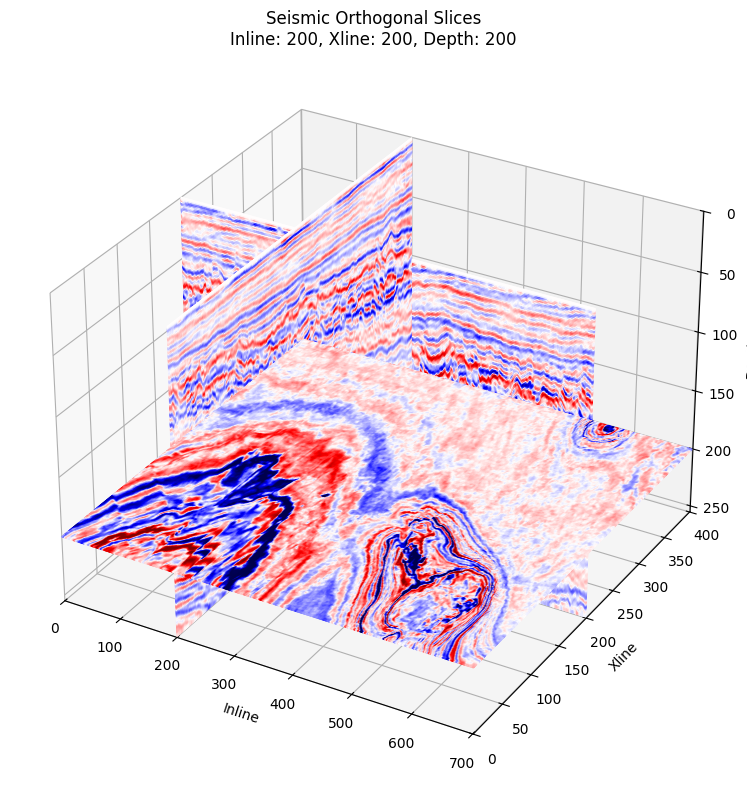

In [51]:
plot_seismic_cube_slice(train_seismic, inline_idx=200, xline_idx=200, depth_idx=200)


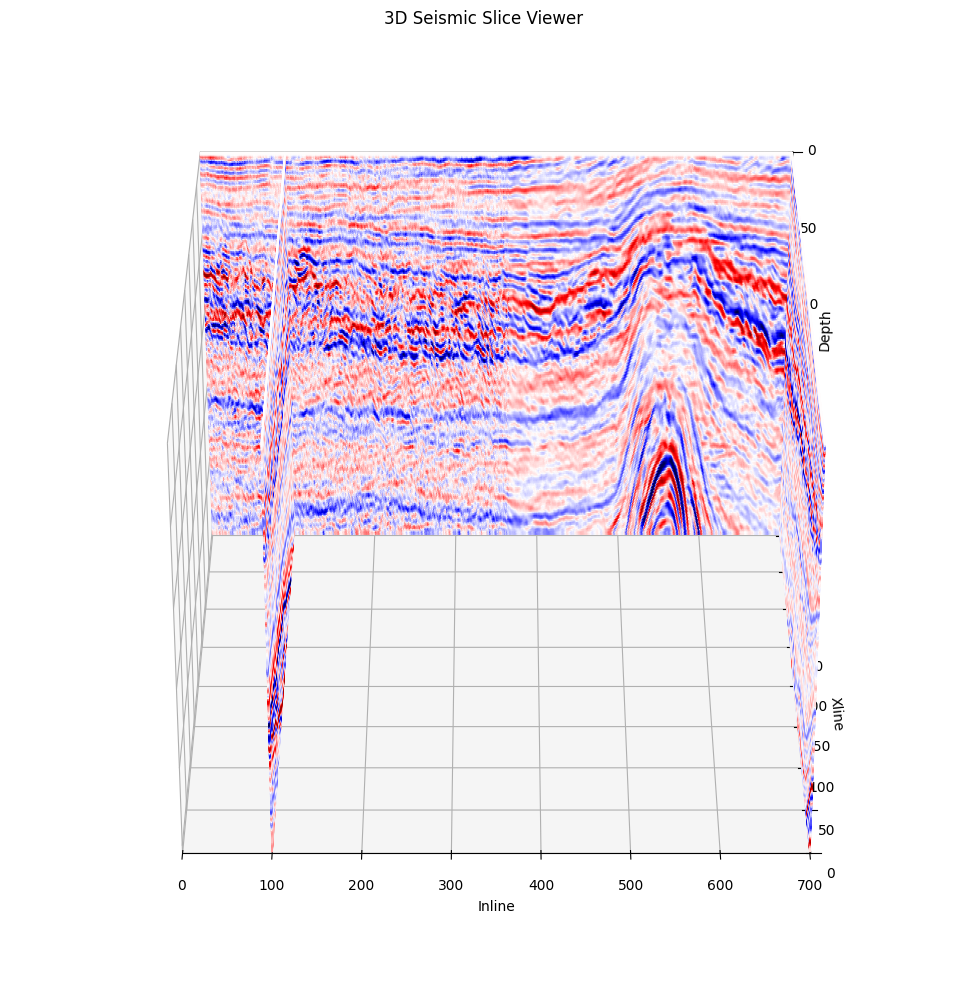

In [62]:
plot_multiple_seismic_slices_3d(train_seismic,
                                 inline_idxs=[100, 700],
                                 xline_idxs=[400],
                                 depth_idxs=None,
                                 azim=-90)

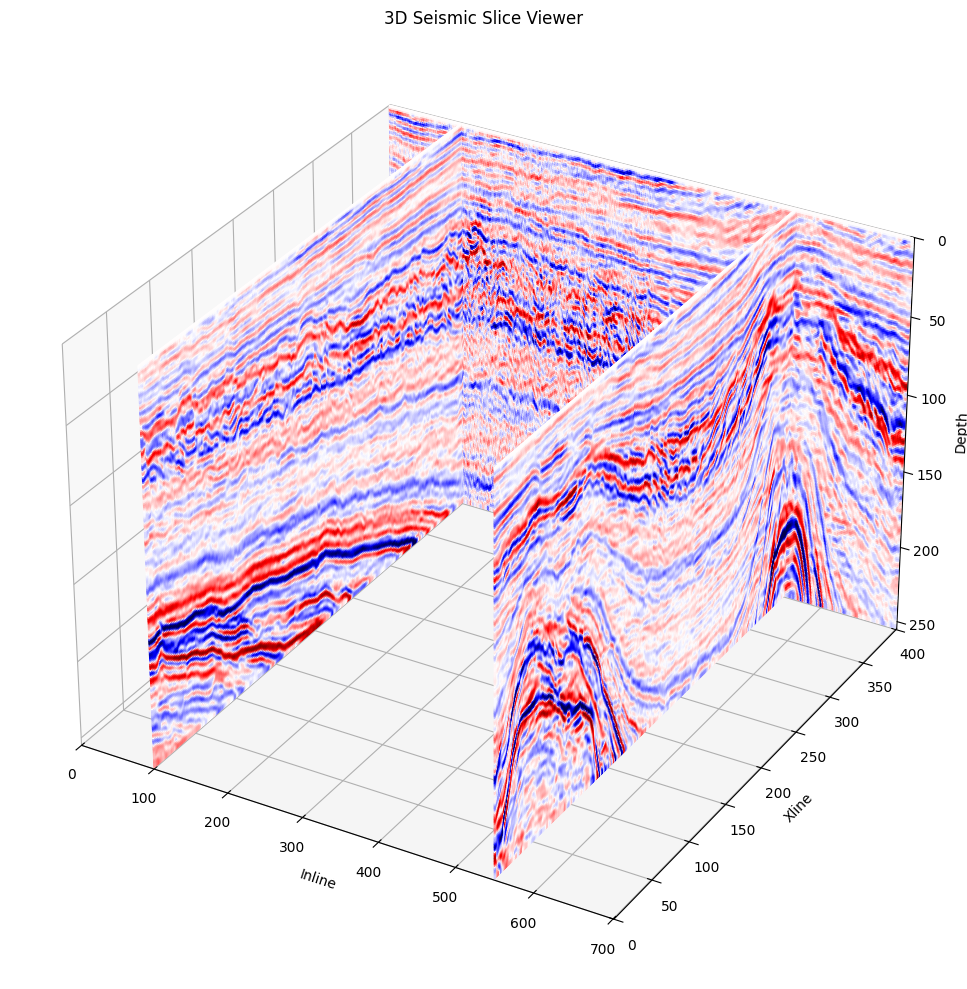

In [63]:
# Plot 2 inlines, 1 xline, and no depth slice
plot_multiple_seismic_slices_3d(train_seismic,
                                 inline_idxs=[100, 550],
                                 xline_idxs=[400],
                                 depth_idxs=None)
